In [1]:
import os
import sys
sys.path.append(os.path.abspath(".."))
import vapor
import scanpy as sc
import torch

# torch.cuda.set_per_process_memory_fraction(0.25, device=0)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

Using device: cuda


In [3]:
adata = sc.read_h5ad('../data/Cyclic_4096_100_T5_g15.0_g210.0_mud0_sd0.5_mua0_sa0.5_rs42.h5ad')

In [4]:
vapor.default_config()

VAPORConfig(time_label=None, root_indices=None, terminal_indices=None, scale=True, latent_dim=64, n_dynamics=10, encoder_dims=[2048, 512, 128], decoder_dims=[128, 512, 2048], epochs=500, batch_size=512, lr=5e-05, device=None, beta=0.02, alpha=1.0, gamma=1.0, eta=1.0, tau=0.75, t_max=5, prune=False, grad_clip=1.0, print_freq=1, plot_losses=True)

Initializing model:
  Input dim: 100
  Latent dim: 64
  Encoder dims: [2048, 512, 128]
  Decoder dims: [128, 512, 2048]
  N dynamics: 10
0.75
No time label provided; proceeding without time supervision.
Data scaled per row.
Training on device: None
Training for 500 epochs with batch size 512
Data split: train=3277, test=819 (test_size=0.2)

Starting training...
--------------------------------------------------------------------------------
Epoch   1/500 | Time:  0.97s | Recon: 1.3869 | KL: 0.1734 | Traj: 1.9728 | Prior: 0.0000 | Psi: 0.9992
Epoch   2/500 | Time:  0.97s | Recon: 0.6931 | KL: 0.2469 | Traj: 1.8690 | Prior: 0.0000 | Psi: 0.9968
Epoch   3/500 | Time:  1.04s | Recon: 0.5363 | KL: 0.2971 | Traj: 1.7921 | Prior: 0.0000 | Psi: 0.9934
Epoch   4/500 | Time:  0.95s | Recon: 0.4157 | KL: 0.3407 | Traj: 1.6791 | Prior: 0.0000 | Psi: 0.9896
Epoch   5/500 | Time:  0.93s | Recon: 0.3544 | KL: 0.3902 | Traj: 1.6114 | Prior: 0.0000 | Psi: 0.9854
Epoch   6/500 | Time:  1.03s | Recon: 0.

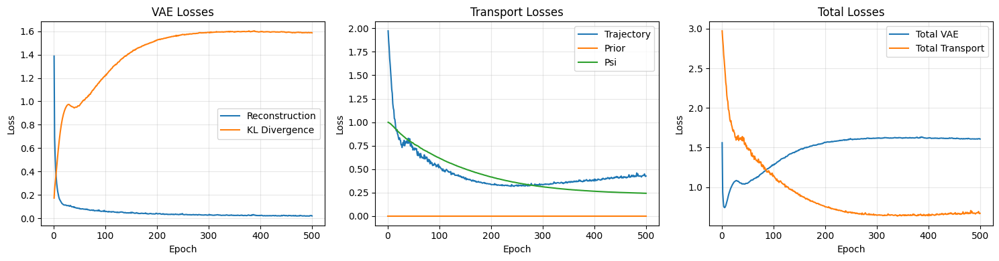

In [5]:
from vapor.config import VAPORConfig

model_config = VAPORConfig(
    lr=5e-4,
    beta=0.01,
    eta=1.0,
    t_max=4,
    epochs=500,
)

# 1) model
model = vapor.initialize_model(
    input_dim=adata.n_vars,
    config=model_config
)

# 2) dataset
dataset = vapor.dataset_from_adata(
    adata,
    root_indices=None,
    terminal_indices=None,
    scale=True,
)

# 3) train 
trained_model = vapor.train_model(
    model,
    dataset,
    config=model_config,
    verbose=True,
)

## 4) save
# save_checkpoint(trained_model, model_config, "out/vapor_ckpt.pt")

In [ ]:
from vapor.inference import extract_latents_and_dynamics
adata_VAPOR = extract_latents_and_dynamics(trained_model, adata, scale=True, device='cpu')

<Axes: title={'center': 't'}, xlabel='UMAP1', ylabel='UMAP2'>

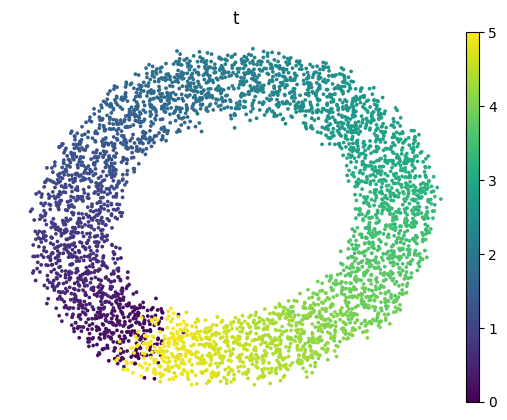

In [7]:
n_neighbors = 30
sc.pp.neighbors(adata_VAPOR, n_neighbors=n_neighbors, random_state=42, use_rep='X')
sc.tl.umap(adata_VAPOR)
sc.pl.embedding(adata_VAPOR, basis='umap', color=['t'], frameon=False, show=False)

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_VAPOR_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_VAPOR_umap', embedded velocity vectors (adata.obsm)


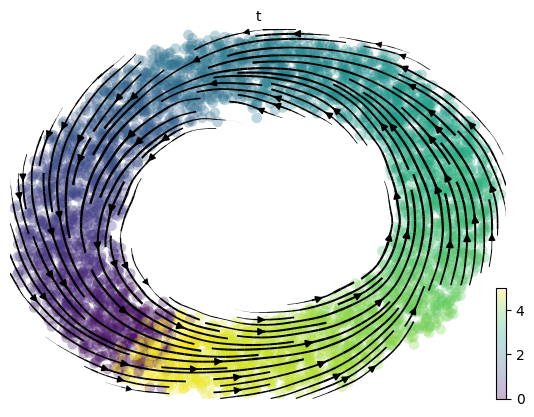

In [8]:
import scvelo as scv
sc.pp.neighbors(adata_VAPOR,use_rep='X_VAPOR', random_state=42, n_neighbors=n_neighbors)
scv.tl.velocity_graph(adata_VAPOR, vkey='v_VAPOR', xkey='vapor')
scv.pl.velocity_embedding_stream(adata_VAPOR, vkey='v_VAPOR', basis='umap',color=['t'])

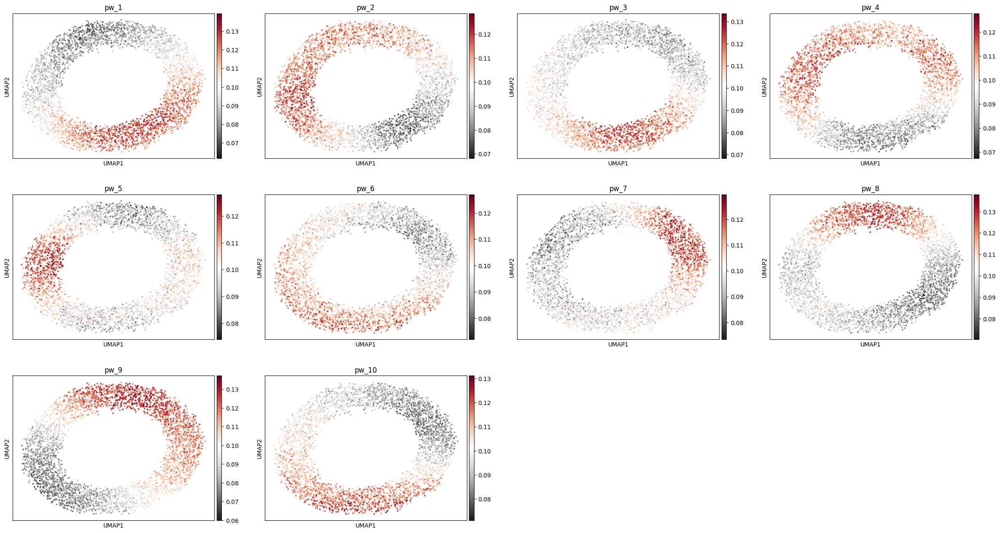

In [9]:
n_dynamics = model.transport_op.n_dynamics
sc.pl.embedding(
    adata_VAPOR,
    color=[f"pw_{i+1}" for i in range(n_dynamics)],
    basis="umap",
    cmap='RdGy_r',
)

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi1_umap', embedded velocity vectors (adata.obsm)


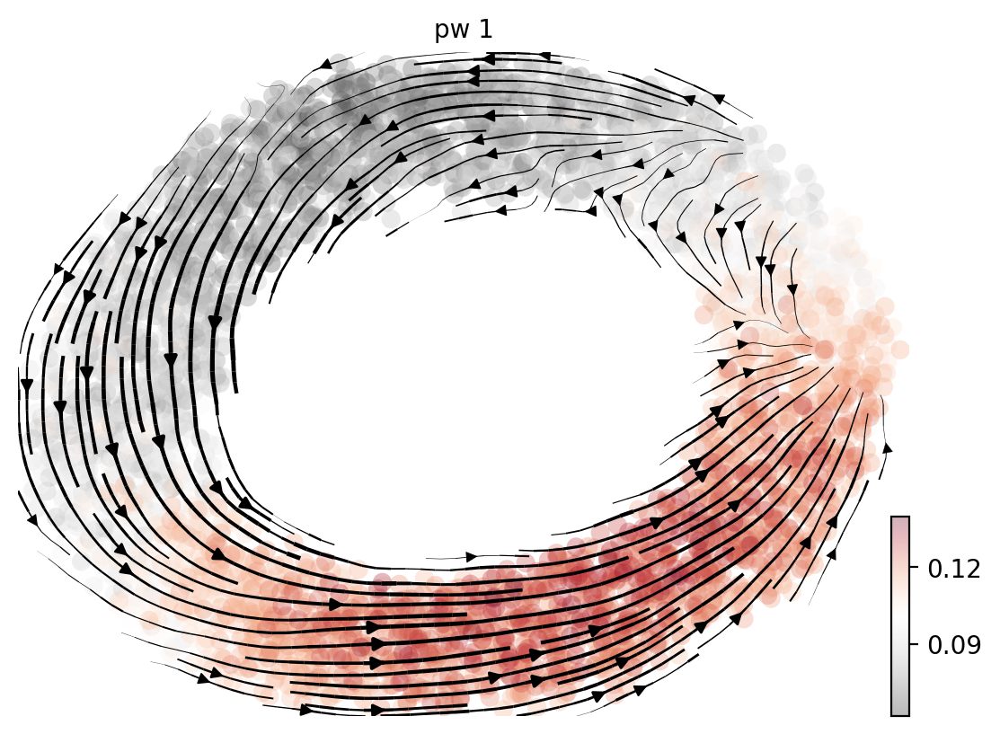

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi2_umap', embedded velocity vectors (adata.obsm)


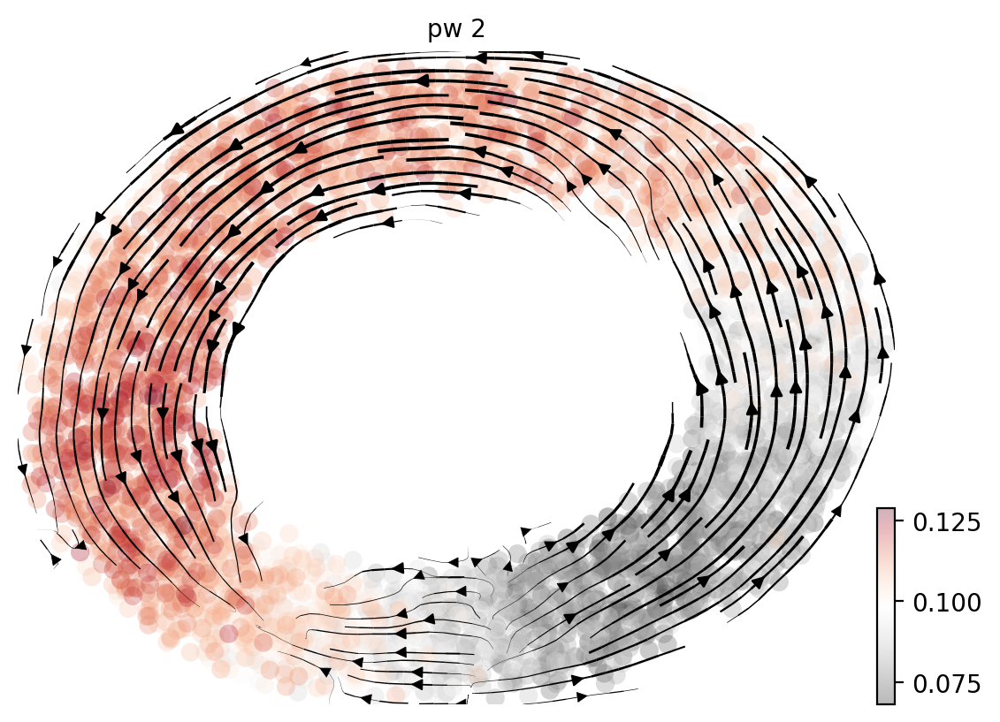

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi3_umap', embedded velocity vectors (adata.obsm)


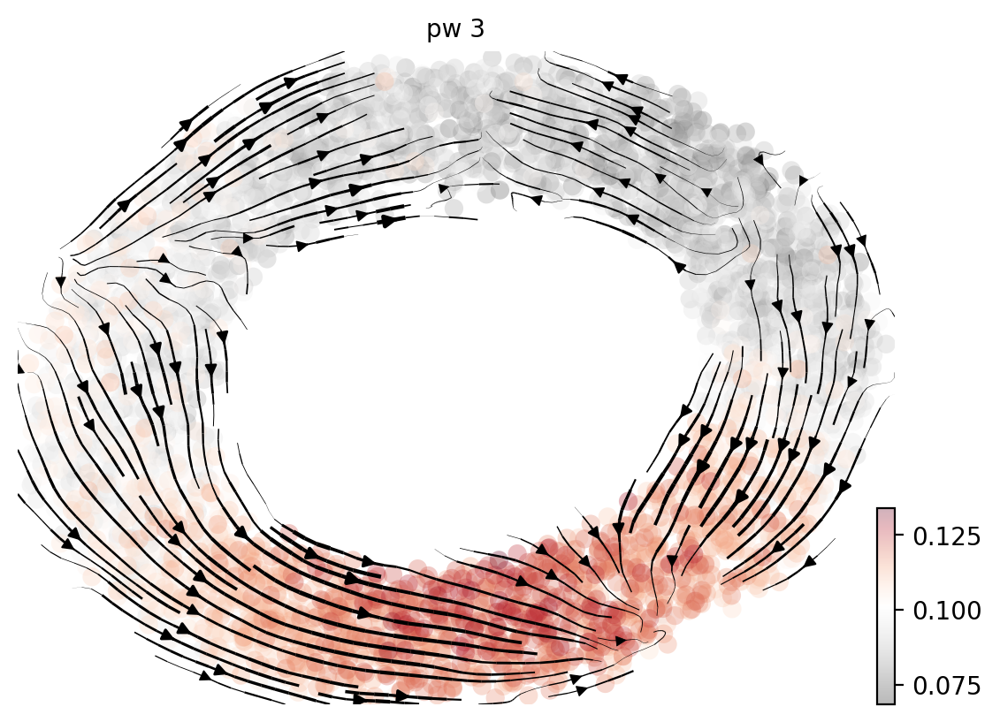

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'v_psi4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi4_umap', embedded velocity vectors (adata.obsm)


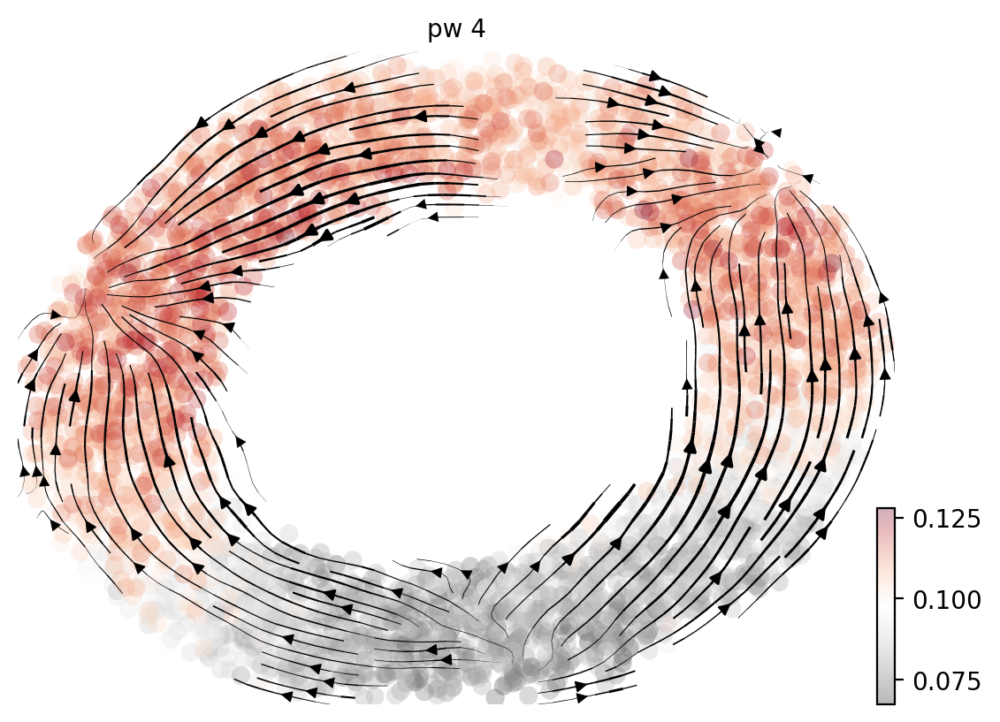

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'v_psi5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi5_umap', embedded velocity vectors (adata.obsm)


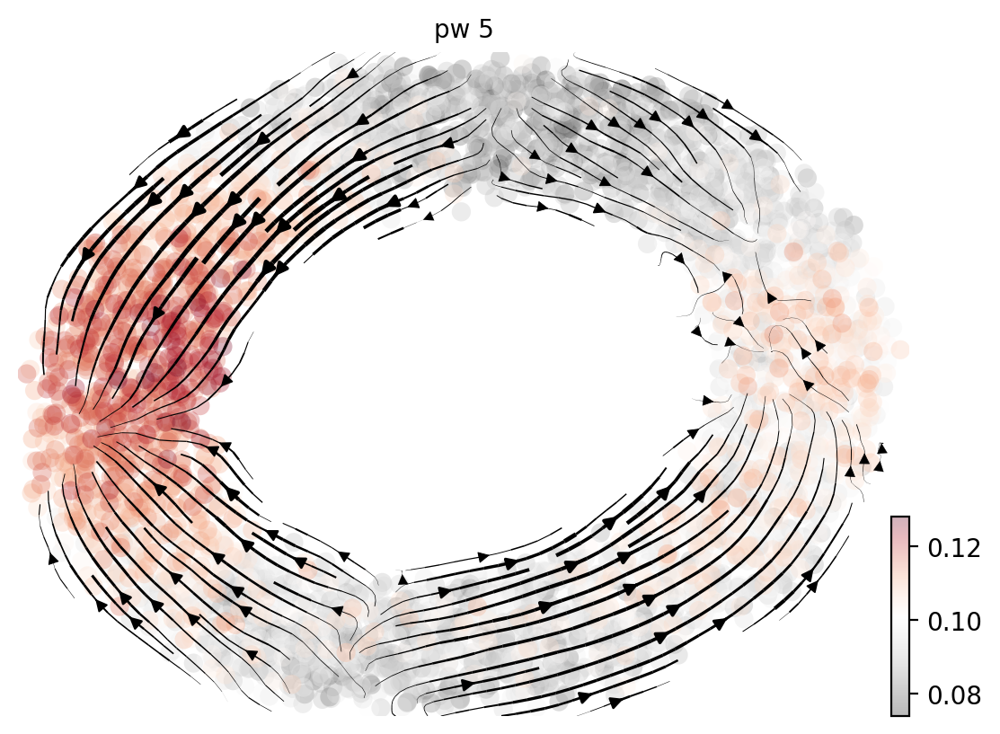

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi6_umap', embedded velocity vectors (adata.obsm)


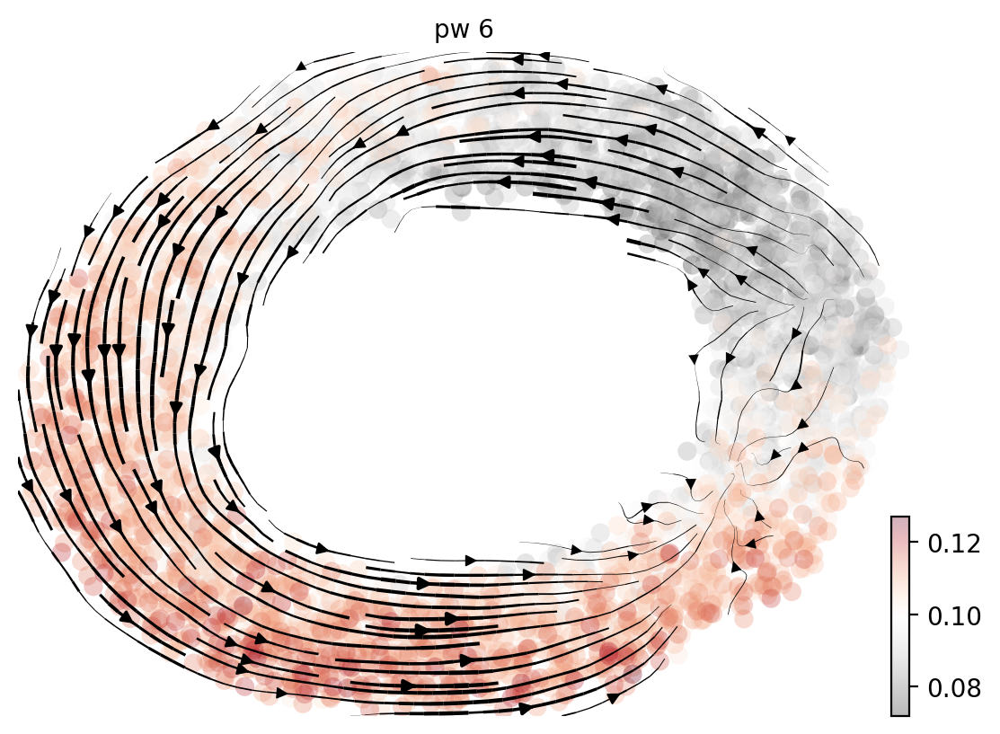

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi7_umap', embedded velocity vectors (adata.obsm)


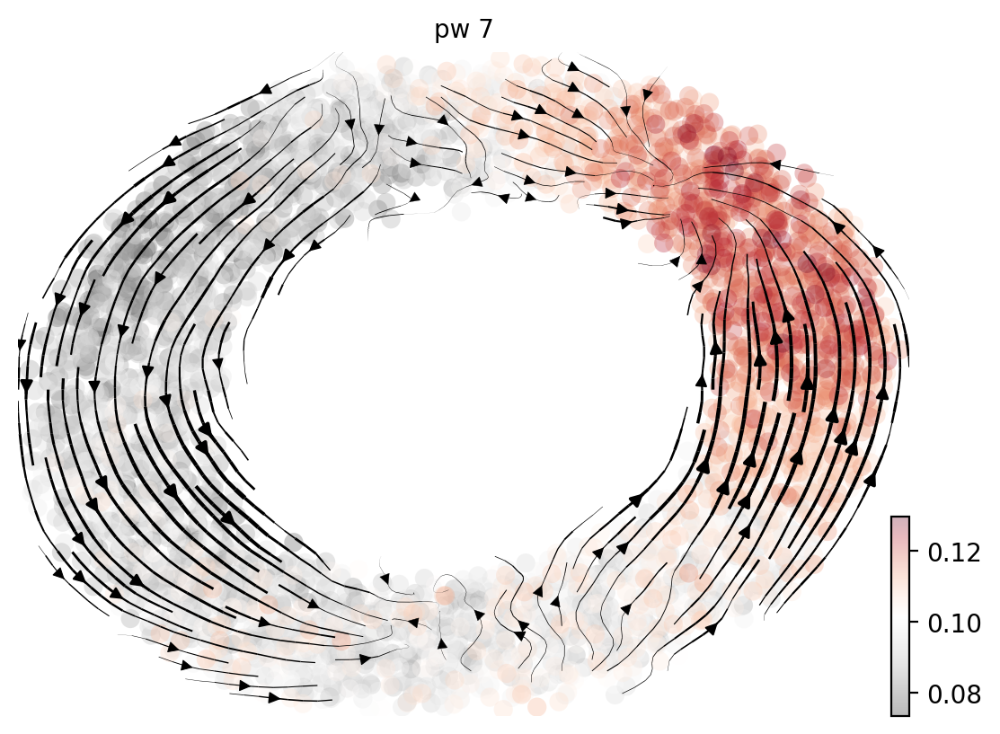

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi8_umap', embedded velocity vectors (adata.obsm)


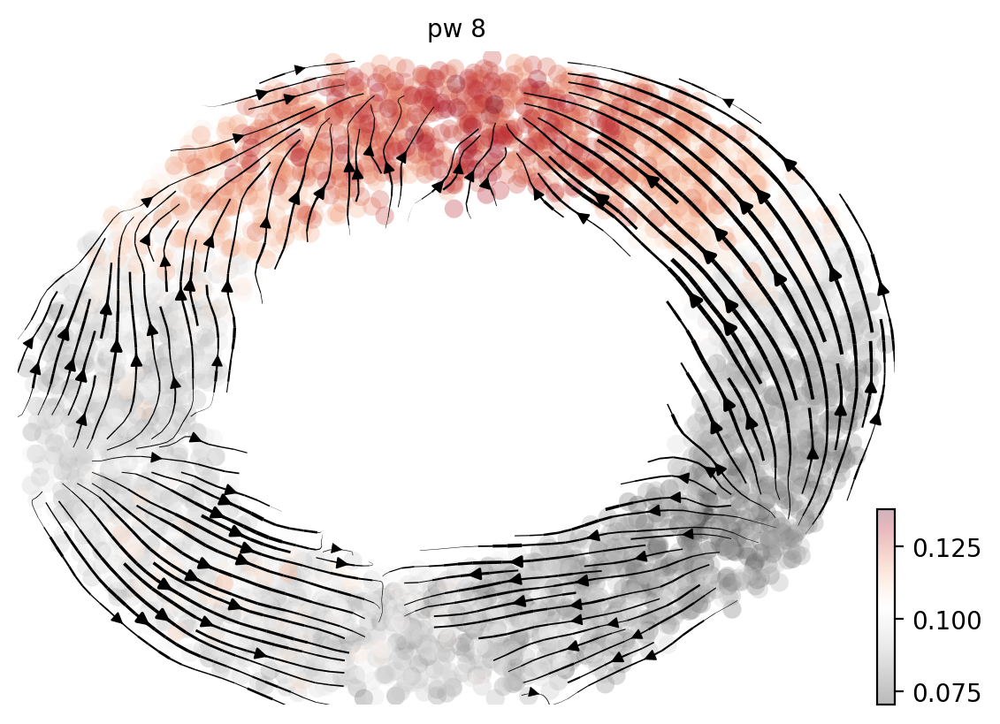

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'v_psi9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi9_umap', embedded velocity vectors (adata.obsm)


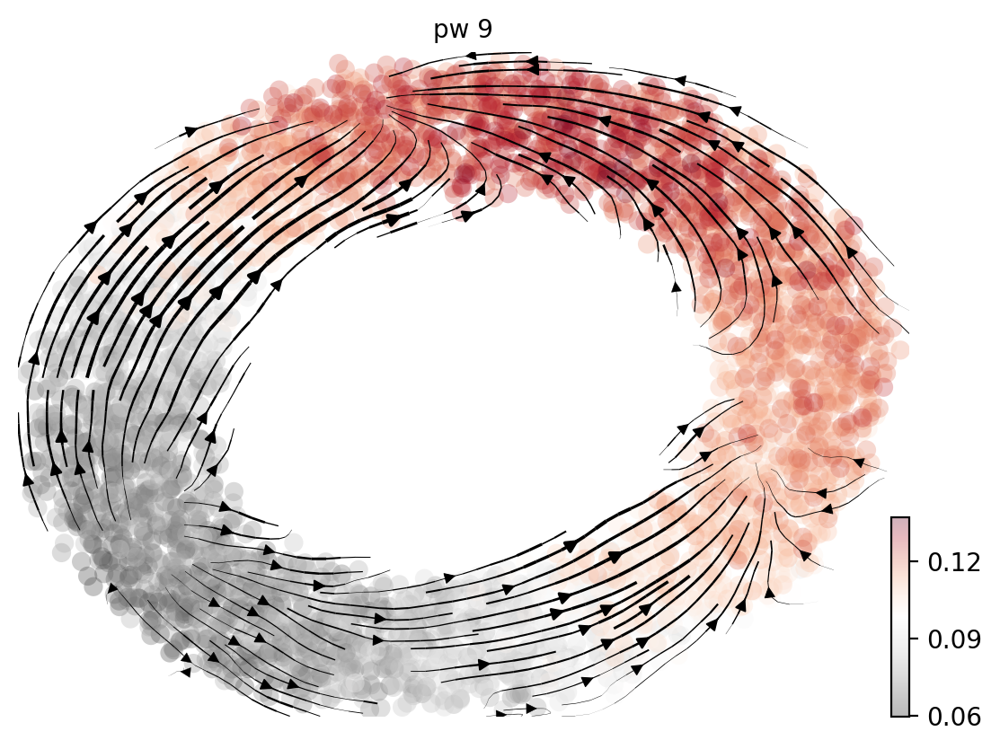

computing velocity graph (using 1/64 cores)


  0%|          | 0/4096 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'v_psi10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi10_umap', embedded velocity vectors (adata.obsm)


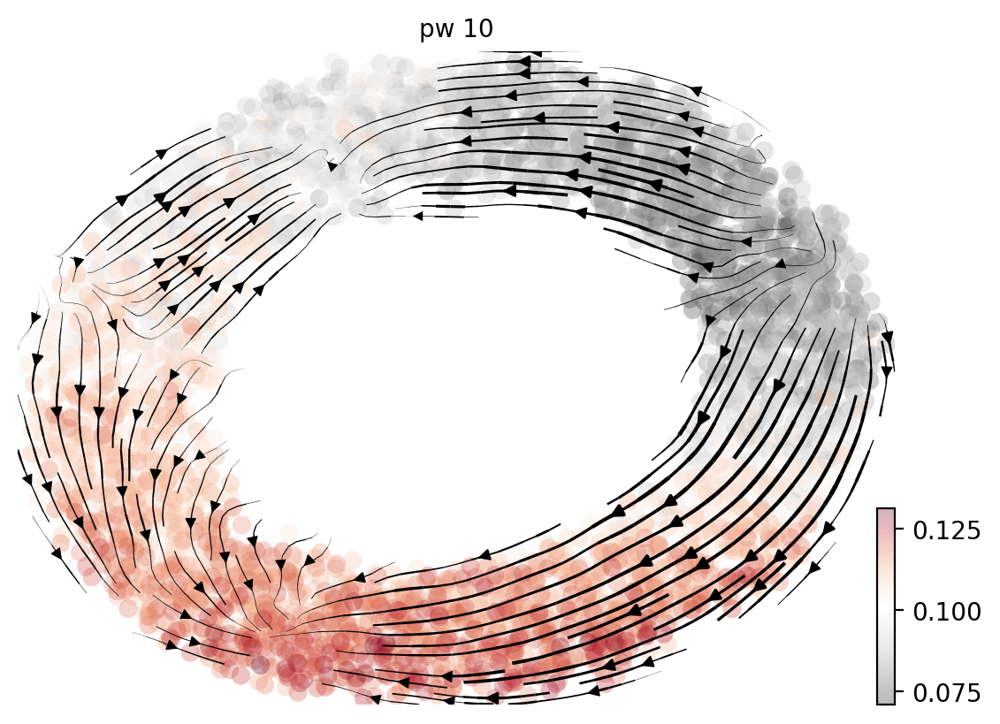

In [10]:
for i in range(n_dynamics):
    sc.pp.neighbors(adata_VAPOR, use_rep='X_VAPOR', random_state=0, n_neighbors=n_neighbors)
    scv.tl.velocity_graph(adata_VAPOR, vkey=f'v_psi{i+1}', xkey='vapor')
    scv.pl.velocity_embedding_stream(
        adata_VAPOR,
        basis='umap',
        vkey=f'v_psi{i+1}',
        color=[f'pw_{i+1}'],
        cmap='RdGy_r',
        show=True,
        n_neighbors=50,
        dpi=200
    )